In [106]:
import jax
import jax.numpy as jnp
import jax.scipy as jsp
import jax.random as jr
import jax.scipy.special as jss
import healpy as hp
import astropy as ap
from astropy.coordinates import SkyCoord
from dustmaps.edenhofer2023 import Edenhofer2023Query
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.table import Table
from functools import partial
from matplotlib.colors import Normalize, TwoSlopeNorm
SIZE = 365
GRAD_MUL = 0.2

@jax.jit
def compare(x, y):
    return jnp.where(x > y, 1, jnp.where(x < y, -1, 0)).astype(jnp.int32)


def simplex_outputs(a, b, c):
    return tuple(jax.nn.softmax(jnp.stack([a, b, c])))

def simplex_outputs_2(a, b):
    return tuple(jax.nn.softmax(jnp.stack([a, b])))

def expected_winnings_player_1(x1, x2, a1, a2):
    result = compare(x1, x2)
    p1_fold_pre, p1_call_pre, p1_raise_pre = simplex_outputs(a1[0], a1[1], a1[2])
    p2_fold_to_raise, p2_call_raise, p2_3bet = simplex_outputs(a2[3], a2[4], a2[5])
    p1_fold_to_3bet, p1_call_3bet, p1_4bet = simplex_outputs(a1[6], a1[7], a1[8])
    p2_fold_to_4bet, p2_call_4bet, p2_jam = simplex_outputs(a2[9], a2[10], a2[11])
    p1_fold_to_jam, p1_call_jam = simplex_outputs_2(a1[12], a1[13])
    sum = -1*p1_fold_pre + 2*result*p1_call_pre + 2*p1_raise_pre*(p2_fold_to_raise + 2*result*p2_call_raise + 2*p2_3bet*(-1*p1_fold_to_3bet + 2*result*p1_call_3bet + 2*p1_4bet*(p2_fold_to_4bet + 2*result*p2_call_4bet + 2*p2_jam*(-1*p1_fold_to_jam + 2*p1_call_jam*result))))
    return sum

def pair_total(i, j, r1, r2):
    return (expected_winnings_player_1(i, j, r1, r2)
            - expected_winnings_player_1(j, i, r2, r1))

def overall_expected_winnings_player_1(a1, a2):
    idx = jnp.arange(a1.shape[0])
    # map over j: hold i and r1 fixed, sweep j and rows of a2
    over_j = jax.vmap(pair_total, in_axes=(None, 0, None, 0))
    # map over i: sweep i and rows of a1, hold the whole j-axis fixed
    over_ij = jax.vmap(over_j, in_axes=(0, None, 0, None))

    return jnp.sum(over_ij(idx, idx, a1, a2))


@jax.jit
def one_step(current_arr, grad_mul):
    obj = lambda new_p: overall_expected_winnings_player_1(new_p, current_arr)
    return current_arr + grad_mul * jax.grad(obj)(current_arr)

@jax.jit
def run(init_arr, n_steps, grad_mul):
    return jax.lax.fori_loop(
        0, n_steps, lambda _, a: one_step(a, grad_mul), init_arr
    )

def convert_to_probabilities(a):
    fold_pre, call_pre, raise_pre = simplex_outputs(a[0], a[1], a[2])
    fold_to_raise, call_raise, three_bet = simplex_outputs(a[3], a[4], a[5])
    fold_to_3bet, call_3bet, four_bet = simplex_outputs(a[6], a[7], a[8])
    fold_to_4bet, call_4bet, jam = simplex_outputs(a[9], a[10], a[11])
    fold_to_jam, call_jam = simplex_outputs_2(a[12], a[13])
    return jnp.asarray([fold_pre, call_pre, raise_pre, fold_to_raise, call_raise, three_bet, fold_to_3bet, call_3bet, four_bet, fold_to_4bet, call_4bet, jam, fold_to_jam, call_jam])

def convert_to_probabilities_2D(X):
    return jax.vmap(convert_to_probabilities)(X)




In [107]:

ACTION_LABELS = [
    "fold_pre", "call_pre", "raise_pre",
    "fold_to_raise", "call_raise", "three_bet",
    "fold_to_3bet", "call_3bet", "four_bet",
    "fold_to_4bet", "call_4bet", "jam",
    "fold_to_jam", "call_jam",
]
 
# Decision nodes: (label, number of actions). Each group's row sums to 1.
NODE_GROUPS = [
    ("P1 pre", 3),
    ("P2 vs raise", 3),
    ("P1 vs 3bet", 3),
    ("P2 vs 4bet", 3),
    ("P1 vs jam", 2),
]
 
NCOL = len(ACTION_LABELS)
 
 
def _group_slices():
    edge = 0
    for label, width in NODE_GROUPS:
        yield label, slice(edge, edge + width)
        edge += width
 
 
def _decorate(ax, M, im, norm, group_notes=None, annotate=True, fmt="{:.2f}",
              title=None, cbar_label="", ann=None, title_pad=72):
    """Shared axis styling for the (SIZE, 14) heatmaps."""
    size = M.shape[0]
 
    ax.set_xticks(range(NCOL))
    ax.set_xticklabels(ACTION_LABELS, rotation=45, ha="left", fontsize=9)
    ax.xaxis.set_ticks_position("top")
    ax.tick_params(axis="x", length=0)
 
    ax.set_yticks(range(size))
    ax.set_yticklabels(range(1, size + 1), fontsize=9)
    ax.tick_params(axis="y", length=0)
    ax.set_ylabel("number", fontsize=10)
 
    ax.set_xticks(np.arange(-0.5, NCOL, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, size, 1), minor=True)
    ax.grid(which="minor", color="white", linewidth=0.5)
    ax.tick_params(which="minor", length=0)
    for spine in ax.spines.values():
        spine.set_visible(False)
 
    for k, (label, sl) in enumerate(_group_slices()):
        if sl.start > 0:
            ax.axvline(sl.start - 0.5, color="white", linewidth=3.0)
        text = label if group_notes is None else f"{label}\n{group_notes[k]}"
        ax.annotate(
            text,
            xy=((sl.start + sl.stop - 1) / 2, 1.0),
            xycoords=("data", "axes fraction"),
            xytext=(0, 62), textcoords="offset points",
            ha="center", va="bottom", fontsize=9.5, weight="semibold",
            annotation_clip=False, linespacing=1.4,
        )
 
    if annotate:
        ann = M if ann is None else ann
        lum = im.cmap(norm(M))[..., :3] @ [0.299, 0.587, 0.114]
        for i in range(size):
            for j in range(NCOL):
                ax.text(
                    j, i, fmt.format(ann[i, j]),
                    ha="center", va="center", fontsize=7.5,
                    color="white" if lum[i, j] < 0.55 else "black",
                )
 
    cb = ax.figure.colorbar(im, ax=ax, fraction=0.025, pad=0.015)
    cb.set_label(cbar_label, fontsize=9)
    cb.outline.set_visible(False)
 
    if title:
        ax.set_title(title, fontsize=12, pad=title_pad, weight="semibold")
 
    ax.figure.tight_layout()
    return ax
 
 
def plot_strategy(P, cmap="magma", annotate=True, title=None, ax=None):
    """Heatmap of a (SIZE, 14) probability array.
 
    Colour scale is fixed to [0, 1] so cells are comparable across the whole
    plot and across separate runs.
    """
    P = np.asarray(P)
    if P.ndim != 2 or P.shape[1] != NCOL:
        raise ValueError(f"expected (SIZE, {NCOL}) array, got {P.shape}")
 
    if ax is None:
        _, ax = plt.subplots(figsize=(10.5, 0.46 * P.shape[0] + 2.4))
 
    norm = Normalize(vmin=0.0, vmax=1.0)
    im = ax.imshow(P, cmap=cmap, norm=norm, aspect="auto")
    return _decorate(ax, P, im, norm, annotate=annotate, fmt="{:.2f}",
                     title=title, cbar_label="probability")
 
 
def strategy_grad(current_arr, payoff_fn):
    """The gradient exactly as one_step computes it: d/d(current_arr) of
    payoff_fn(new_arr, current_arr), evaluated at new_arr = current_arr."""
    return jax.grad(lambda new_p: payoff_fn(new_p, current_arr))(current_arr)
 
 
def plot_grad(current_arr, payoff_fn = overall_expected_winnings_player_1, normalize="global", cmap="RdBu_r",
              annotate=True, title=None, ax=None):
    """Diverging heatmap of the ascent gradient on a (SIZE, 14) logit array.
 
    normalize="global": one symmetric scale (+/- max|g|) across all cells, so
        cell sizes are directly comparable but small-gradient nodes wash out.
    normalize="group":  each decision node rescaled by its own max|g|, so
        within-node sign structure is visible even where gradients are tiny.
        Colours are then relative and NOT comparable across nodes.
    """
    G = np.asarray(strategy_grad(current_arr, payoff_fn), dtype=float)
    if G.ndim != 2 or G.shape[1] != NCOL:
        raise ValueError(f"expected (SIZE, {NCOL}) array, got {G.shape}")
 
    if ax is None:
        _, ax = plt.subplots(figsize=(10.5, 0.46 * G.shape[0] + 2.7))
 
    def exp_of(x):
        m = np.max(np.abs(x))
        return int(np.floor(np.log10(m))) if m > 0 else 0
 
    if normalize == "global":
        e = exp_of(G)
        shown, ann, notes = G / 10.0 ** e, None, None
        lim = max(np.max(np.abs(shown)), 1e-12)
        cbar = f"gradient (x1e{e})" if e else "gradient"
    elif normalize == "group":
        shown, ann, notes = np.zeros_like(G), np.zeros_like(G), []
        for _, sl in _group_slices():
            block = G[:, sl]
            peak = max(np.max(np.abs(block)), 1e-30)
            shown[:, sl] = block / peak          # colour: [-1, 1] within node
            e = exp_of(block)
            ann[:, sl] = block / 10.0 ** e       # text: real magnitude
            notes.append(f"x1e{e}" if e else "x1")
        lim = 1.0
        cbar = "gradient / node peak"
    else:
        raise ValueError("normalize must be 'global' or 'group'")
 
    # Symmetric about zero so the colormap's neutral midpoint means "no push".
    norm = TwoSlopeNorm(vmin=-lim, vcenter=0.0, vmax=lim)
    im = ax.imshow(shown, cmap=cmap, norm=norm, aspect="auto")
    return _decorate(ax, shown, im, norm, group_notes=notes, annotate=annotate,
                     fmt="{:+.2f}", title=title, cbar_label=cbar, ann=ann,
                     title_pad=72 if notes is None else 96)

def plot_strategy_wrapper(xi):
    plot_strategy(convert_to_probabilities_2D(xi))

def plot_grad_wrapper(xi):
    plot_grad(xi)

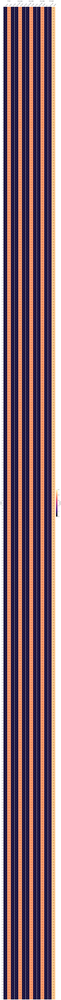

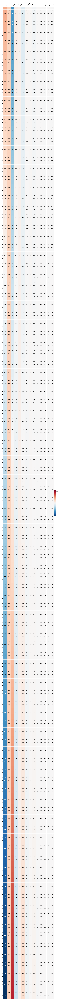

In [108]:
initial_coordinates = jnp.zeros(shape = (SIZE, 14))
initial_coordinates = initial_coordinates.at[:, 1::3].set(2.0)
plot_strategy_wrapper(initial_coordinates)
plot_grad_wrapper(initial_coordinates)

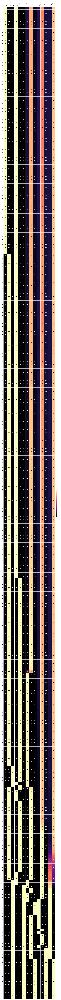

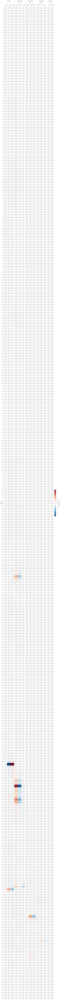

In [109]:

final_coordinates = run(initial_coordinates, 100000, GRAD_MUL)
plot_strategy_wrapper(final_coordinates)
plot_grad_wrapper(final_coordinates)